# NetPyNE Tutorial 9: Evolutionary Algorithm for Parameters Optimization

## Preliminaries

If you are going to run this notebook locally using Jupyter Notebook, start from following instructions https://github.com/suny-downstate-medical-center/netpyne/blob/development/netpyne/tutorials/README.md.

If you are using Open Source Brain or EBRAINS, everything is already set up.

On any other online platform (e.g. on Google Collab) you might need to run the following commmands to install NEURON and NetPyNE using **pip**:
```
!pip install neuron
!pip install netpyne
```



Code in this tutorial provides the set up of batch simulation itself, while the network paramters and default configuration of individual simulations are provided in separate files in `tut_batch_evol` folder. We will switch to this folder to make these files accessible from this notebook. We also need to install `inspyred`, which implements the core of evolutionary algorithm.

In [2]:
!pip install inspyred
import os
os.chdir(os.getcwd()+'/batch_run_development')
print(os.getcwd())

/mnt/disk15tb/adam/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development


In [3]:
## Hold Neuron Locations Constant Across Simulations

# # %matplotlib inline
# from netpyne import specs
# from netpyne.batch import Batch

# netParams = specs.NetParams()   # object of class NetParams to store the network parameters

# netParams.sizeX = 2000 # x-dimension (horizontal length) size in um
# netParams.sizeY = 1000 # y-dimension (vertical height or cortical depth) size in um
# netParams.sizeZ = 0 # z-dimension (horizontal length) size in um
# # I think I will modulate these
# #netParams.propVelocity = 100.0     # propagation velocity (um/ms)
# netParams.probLengthConst = 500 # length constant for conn probability (um)

# ## Population parameters
# netParams.popParams['E'] = {
#     'cellType': 'E', 
#     'numCells': 300, 
#     'yRange': [100,1900], 
#     'xRange': [100,3900]}
# netParams.popParams['I'] = {
#     'cellType': 'I', 
#     'numCells': 100, 
#     'yRange': [100,1900], 
#     'xRange': [100,3900]}

# filename = 'constant_neuron_locs'
# netParams.save(filename+'_netParams.json')


In [4]:

# networkType = 'aw' #'simple' # 'simple' or 'complex'

# if networkType == 'simple':
#     ## simple net
#     params = specs.ODict()
#     params['prob'] = [0.01, 0.5]
#     params['weight'] = [0.001, 0.1]
#     params['delay'] = [1, 20]

#     pops = {}
#     pops['S'] = {'target': 5, 'width': 2, 'min': 2}
#     pops['M'] = {'target': 15, 'width': 2, 'min': 0.2}

# elif networkType == 'aw':
#     ## Thoughtful Params
#     params = specs.ODict()
#     params['probEall'] = [0.05, 0.2] # 0.1
#     params['weightEall'] = [0.0025, 0.0075] #5.0
#     params['probIE'] = [0.2, 0.6] #0.4
#     params['weightIE'] = [0.0005, 0.002]
#     #params['probLengthConst'] = 500
#     params['stimWeight'] = [0.05, 0.2]
#     params['propVelocityInhib'] = [0.1, 2]
#     params['propVelocityExcite'] = [0.1, 1]

#     # pops = {}
#     # pops['E2'] = {'target': 5, 'width': 2, 'min': 1}
#     # pops['I2'] = {'target': 10, 'width': 5, 'min': 2}
#     # pops['E4'] = {'target': 30, 'width': 10, 'min': 1}
#     # pops['I4'] = {'target': 10, 'width': 3, 'min': 2}
#     # pops['E5'] = {'target': 40, 'width': 4, 'min': 1}
#     # pops['I5'] = {'target': 25, 'width': 5, 'min': 2}
# elif networkType == 'complex':
#     ##complex net
#     params = specs.ODict()
#     params['probEall'] = [0.05, 0.2] # 0.1
#     params['weightEall'] = [0.0025, 0.0075] #5.0
#     params['probIE'] = [0.2, 0.6] #0.4
#     params['weightIE'] = [0.0005, 0.002]
#     params['probLengthConst'] = [100,200]
#     params['stimWeight'] = [0.05, 0.2]

#     pops = {}
#     pops['E2'] = {'target': 5, 'width': 2, 'min': 1}
#     pops['I2'] = {'target': 10, 'width': 5, 'min': 2}
#     pops['E4'] = {'target': 30, 'width': 10, 'min': 1}
#     pops['I4'] = {'target': 10, 'width': 3, 'min': 2}
#     pops['E5'] = {'target': 40, 'width': 4, 'min': 1}
#     pops['I5'] = {'target': 25, 'width': 5, 'min': 2}

Provide fitness function and it's arguments:

In [5]:
# fitnessFuncArgs = {}
# fitnessFuncArgs['pops'] = pops
# fitnessFuncArgs['maxFitness'] = 1000

# def fitnessFunc(simData, **kwargs):
#     import numpy as np
#     pops = kwargs['pops']
#     maxFitness = kwargs['maxFitness']
#     popFitness = [None for i in pops.items()]
#     popFitness = [min(np.exp(  abs(v['target'] - simData['popRates'][k])  /  v['width']), maxFitness)
#             if simData["popRates"][k]>v['min'] else maxFitness for k,v in pops.items()]
#     fitness = np.mean(popFitness)
#     popInfo = '; '.join(['%s rate=%.1f fit=%1.f'%(p,r,f) for p,r,f in zip(list(simData['popRates'].keys()), list(simData['popRates'].values()), popFitness)])
#     print('  '+popInfo)
#     return fitness

Here we create `Batch` object with paramaters to tune, and set output folder, optimization method ('evol'), fitness function and all the configurations from above.

In [6]:
# from netpyne import sim
# batch = Batch(params=params)
# #_, netParams = sim.readCmdLineArgs(netParamsDefault='netParams.py')

# # Set output folder, grid method (all param combinations), and run configuration
# batch.batchLabel = 'simple'
# batch.batchLabel = 'aw_grid'	
# batch.saveFolder = './' + batch.batchLabel
# #batch.method = 'evol'
# #batch.netParams = netParams
# #batch.netParamsFile = 'netParams.py'
# batch.method = 'grid'
# batch.runCfg = {
# 	'type': 'mpi_bulletin',#'hpc_slurm',
# 	'script': 'init.py',
# 	# options required only for hpc
# 	'mpiCommand': 'mpirun',
# 	'nodes': 1,
# 	'coresPerNode': 2,
# 	'allocation': 'default',
# 	#'email': 'salvadordura@gmail.com',
# 	'reservation': None,
#     'skip': True,
# 	#'folder': '/home/salvadord/evol'
# 	#'custom': 'export LD_LIBRARY_PATH="$HOME/.openmpi/lib"' # only for conda users
# }
# # batch.evolCfg = {
# # 	'evolAlgorithm': 'custom',
# # 	'fitnessFunc': fitnessFunc, # fitness expression (should read simData)
# # 	'fitnessFuncArgs': fitnessFuncArgs,
# # 	'pop_size': 6,
# # 	'num_elites': 1, # keep this number of parents for next generation if they are fitter than children
# # 	'mutation_rate': 0.4,
# # 	'crossover': 0.5,
# # 	'maximize': False, # maximize fitness function?
# # 	'max_generations': 4,
# # 	'time_sleep': 5, # wait this time before checking again if sim is completed (for each generation)
# # 	'maxiter_wait': 40, # max number of times to check if sim is completed (for each generation)
# # 	'defaultFitness': 1000 # set fitness value in case simulation time is over
# }

In [7]:
# #batch.run()
# from batchRun_awHDMEA import batchEvol
# networkType = 'aw'
# params = specs.ODict()
# params['probEall'] = 0.05  # Probability of excitatory-excitatory connections
# params['weightEall'] = 0.0025  # Weight of excitatory-excitatory connections
# params['probIE'] = 0.2  # Probability of inhibitory-excitatory connections
# params['weightIE'] = 0.0005  # Weight of inhibitory-excitatory connections
# params['stimWeight'] = 0.05  # Weight of external stimulation

# params['propVelocityInhib'] = 0.1  # Propagation velocity for inhibitory neurons (μm/ms)
# params['propVelocityExcite'] = 0.1  # Propagation velocity for excitatory neurons (μm/ms)

# params['gnabar_E'] = 0.1  # Maximum conductance of Na+ channels in excitatory neurons (S/cm^2)
# params['gkbar_E'] = 0.03  # Maximum conductance of K+ channels in excitatory neurons (S/cm^2)
# params['gnabar_I'] = 0.1  # Maximum conductance of Na+ channels in inhibitory neurons (S/cm^2)
# params['gkbar_I'] = 0.03  # Maximum conductance of K+ channels in inhibitory neurons (S/cm^2)        

# params['tau1_exc'] = 0.5  # Rise time constant of excitatory synaptic conductance (ms)
# params['tau2_exc'] = 4.0  # Decay time constant of excitatory synaptic conductance (ms)
# params['tau1_inh'] = 0.5  # Rise time constant of inhibitory synaptic conductance (ms)
# params['tau2_inh'] = 7.0  # Decay time constant of inhibitory synaptic conductance (ms)
# batchEvol(networkType, params = params)

/mnt/disk15tb/adam/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development
/mnt/disk15tb/adam/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development/aw_grid
aw_grid_0_0_0_0_0_3_0_0_0_0_0_0_0_0_0_0_data.json
Loading file /mnt/disk15tb/adam/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development/aw_grid/aw_grid_0_0_0_0_0_3_0_0_0_0_0_0_0_0_0_0_data.json ... 
Loading simConfig...
Loading netParams...
Loading net...
  Created 12400 cells
  Created 2381581 connections
  Created 12400 stims
Unable to create NEURON objects: 'E'
  Done; re-instantiate net time = 1.43 s
Loading simData...
Preparing spike data...
Preparing spike data...
Plotting raster...
Plotting 2D representation of network cell locations and connections...
aw_grid_0_0_0_0_0_2_0_0_0_0_0_0_0_0_0_0_data.json
Loading file /mnt/disk15tb/adam/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development/

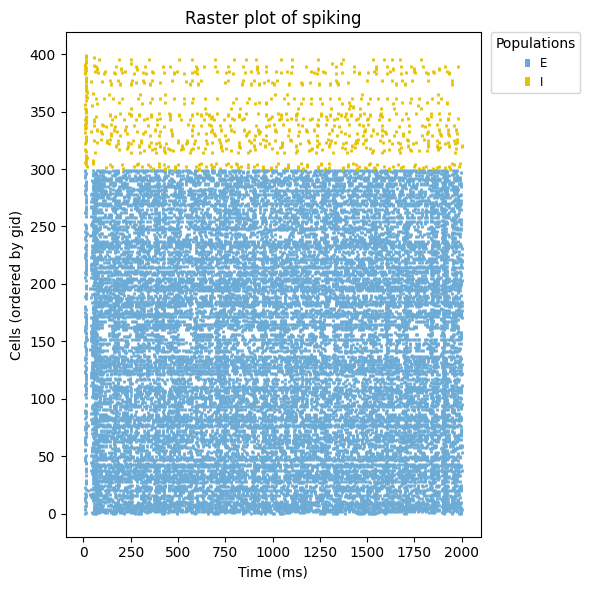

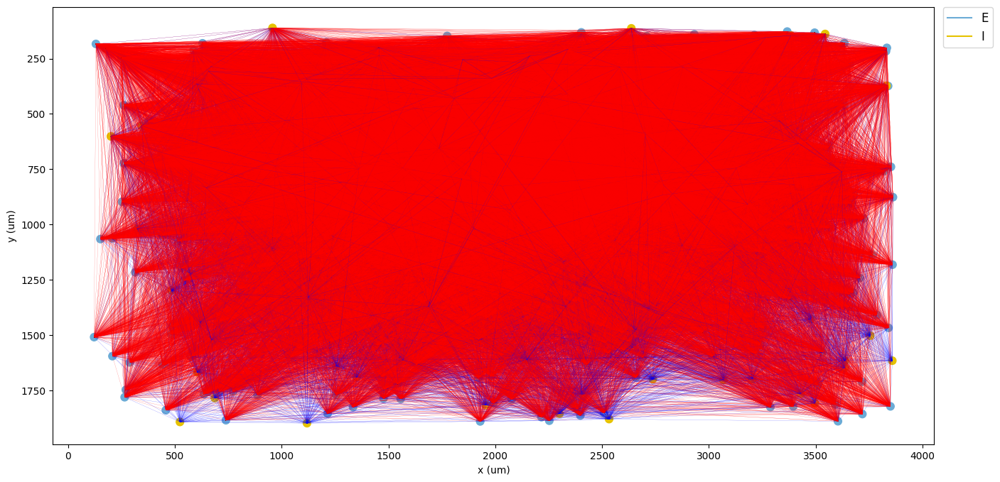

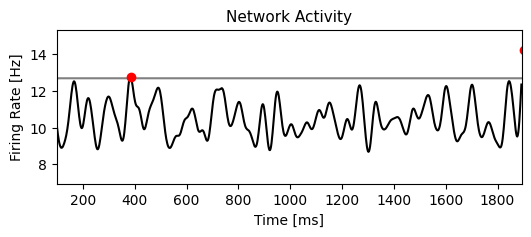

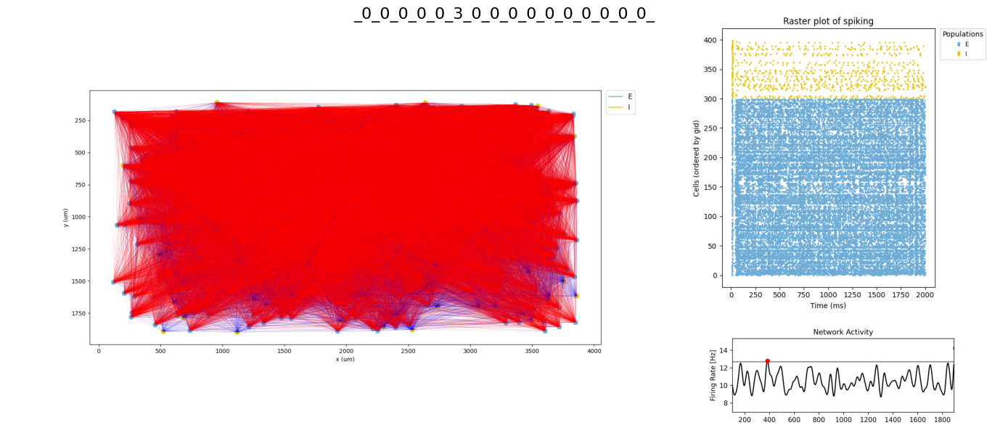

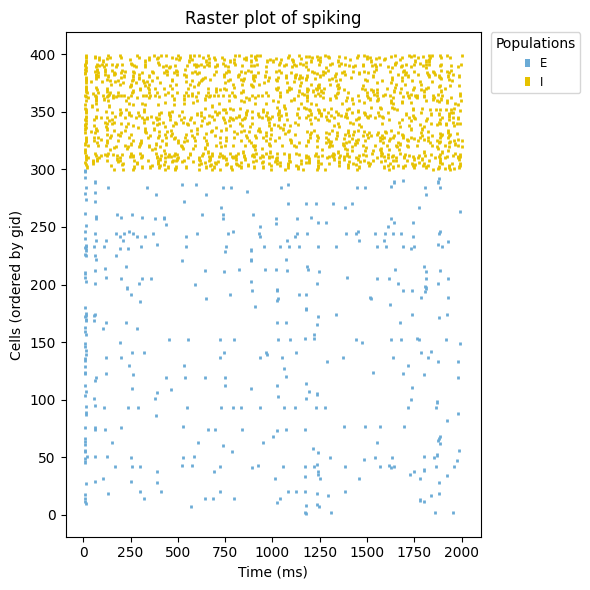

...

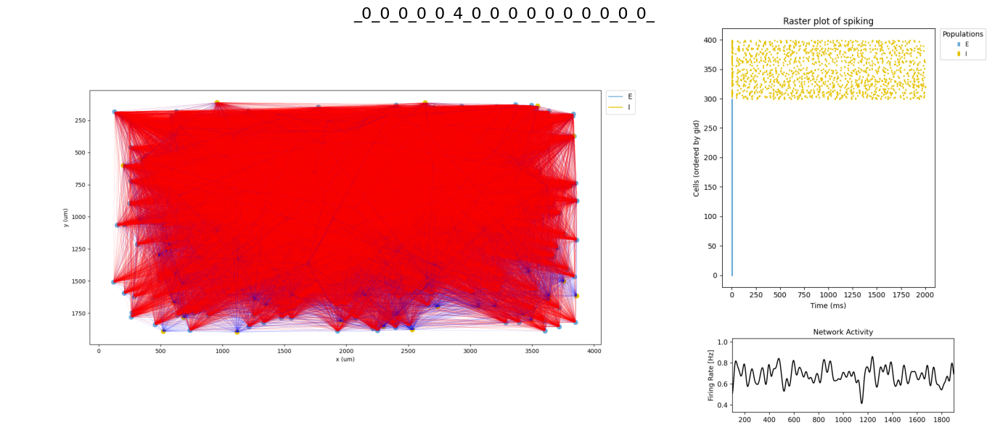

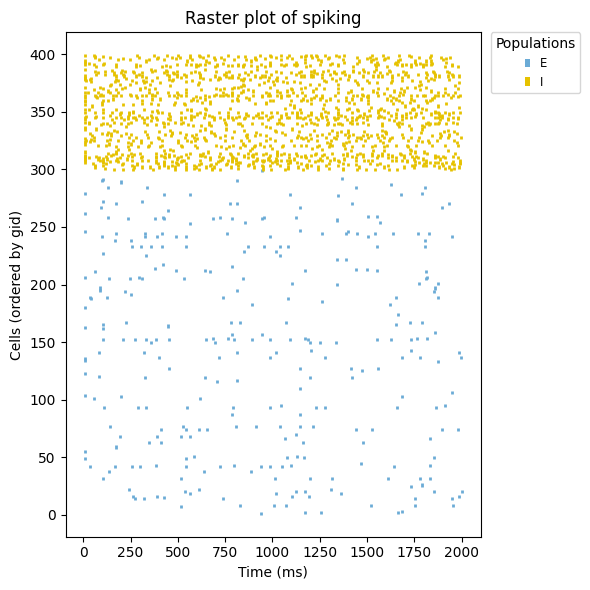

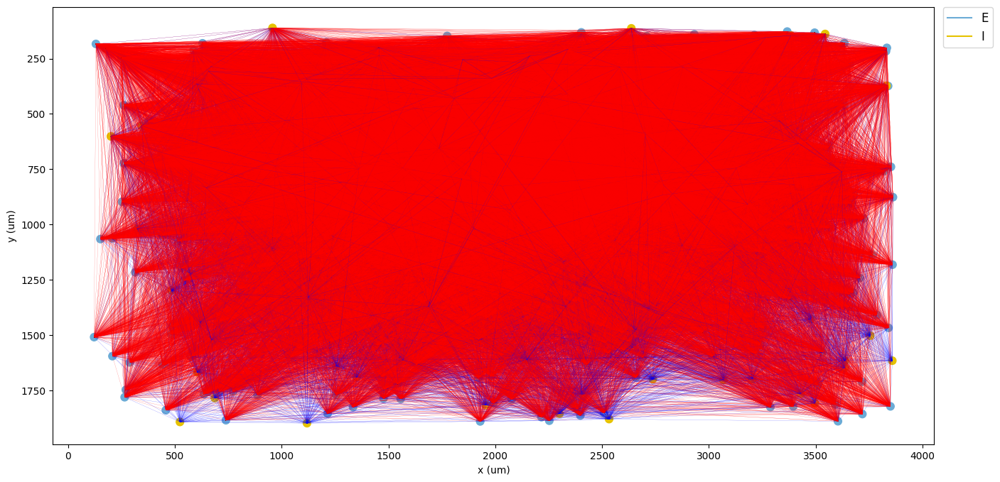

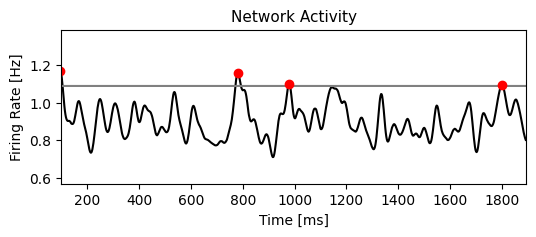

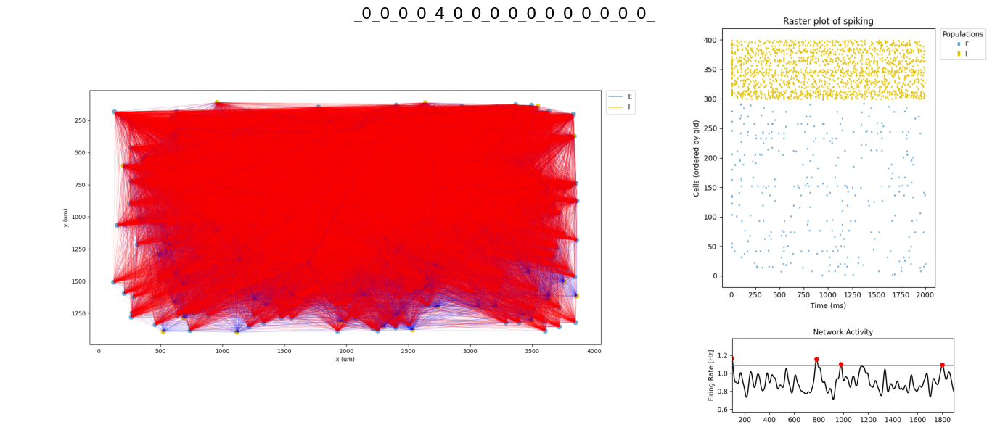

In [14]:
#from BurstingPlotDevelopment import plot_network_activity
import os
import json
from plot_network_activity import plot_network_activity
from netpyne import sim
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import scipy
from scipy.ndimage import zoom

#simulation plots will be saved in the batch folder as png files
#location: nb2/batch_run_development/aw_grid_*batchLabel*/*_data.json
batchLabel = 'aw_grid'
print(os.getcwd())
batch_path  = os.getcwd() + '/' + batchLabel
print(batch_path)
binSize=0.02*100
gaussianSigma=0.13*100
 
#for each file named *_cfg.json in the batch folder, get raster data
for file in os.listdir(batch_path):
    if file.endswith("_data.json"):
        print(file) 
        sim.loadAll(batch_path+'/'+file)
        batch_key = file.split('grid')[1].split('data')[0]
        rasterData = sim.analysis.prepareRaster()
              
        # Define the paths to the raster plot and network activity images
        raster_plot_path = batch_path +'/'+'aw_grid'+batch_key+'raster.png'
        network_activity_path = batch_path +'/'+batch_key+'_network_activity_def.png'
        TWODnet_path = batch_path +'/'+'aw_grid'+batch_key+'plot_2Dnet.png'     
        
       # Define the sizes for the plots
        raster_height = 6
        raster_width = 6
        network_activity_height = raster_height / 3
        network_activity_width = raster_width
        locations_height = raster_height + network_activity_height
        locations_width = locations_height*2

        # Generate the raster plot with a size of (10, 10)
        rasterPlot = sim.analysis.plotRaster(saveFig=raster_plot_path, showFig=False, figSize=(raster_width, raster_height))

        # Generate the 2Dnet plot with a size of (15, 20)
        locations_plot = sim.analysis.plot2Dnet(saveFig=TWODnet_path, showFig=False, figSize=(locations_width, locations_height))

        # Generate the network activity plot with a size of (10, 5)
        plot_network_activity(
            rasterData, 
            binSize=binSize, 
            gaussianSigma=gaussianSigma, 
            thresholdBurst=1.2, 
            figSize=(network_activity_width, network_activity_height), 
            saveFig=network_activity_path
        )        

         # Load the images
        raster_plot = mpimg.imread(raster_plot_path)
        network_activity = mpimg.imread(network_activity_path)
        TWODnet = mpimg.imread(TWODnet_path)
        
        # Create a new figure
        fig = plt.figure(figsize=(14, 6))

        # Add the 2Dnet plot to the left part of the figure
        ax1 = plt.subplot2grid((4, 3), (0, 0), rowspan=4, colspan=2)
        ax1.imshow(TWODnet)
        ax1.axis('off')  # Hide axes

        # Add the raster plot to the top right part of the figure
        ax2 = plt.subplot2grid((4, 3), (0, 2), rowspan=3)
        ax2.imshow(raster_plot)
        ax2.axis('off')  # Hide axes

        # Add the network activity plot to the bottom right part of the figure
        ax3 = plt.subplot2grid((4, 3), (3, 2))
        ax3.imshow(network_activity)
        ax3.axis('off')  # Hide axes

        # Adjust layout to fit subplots tightly
        plt.tight_layout()
        # Save the combined figure in the batch folder
        # batch key as fig title
        fig.suptitle(batch_key, fontsize=16)
        
        root = f'/home/adam/workspace/git_workspace/netpyne/hdmea_simulations/BurstingPlotDevelopment/nb2/batch_run_development/{batchLabel}'
        NetworkBurstingFolder = 'NetworkBurst_and_Raster_Figs'
        if not os.path.exists(f'{root}/{NetworkBurstingFolder}'):
            os.makedirs(f'{root}/{NetworkBurstingFolder}')
        combined_figure_path = f'{root}/NetworkBurst_and_Raster_Figs/{batch_key}combined_figure.png'  # replace with your actual path
        plt.savefig(combined_figure_path)
